### Advanced Lane Finding Project

Expected steps:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [248]:
# Import routine
import os, glob, time
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

In [249]:
# Step 1. Camera calibration

def calibrate_camera(calib_folder, save_result=False, destination_folder='output_images'):
    nx = 9
    ny = 6
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(calib_folder+'/calibration*.jpg')      
    imshape = None
    out_img = None
    # Step through the list and search for chessboard corners
    for fname in images:
        img = mpimg.imread(fname)
        out_img = img
        imshape = img.shape
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)    
    
    if imshape is not None:
        if save_result:
            cv2.imwrite(os.path.join(destination_folder,'step1_chessboard.png'), cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))
    
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape[1::-1], None, None)
        return ret, mtx, dist, rvecs, tvecs
    else:
        print('Cannot find any image in given folder. Exiting')
        return None
    

In [250]:
## Step 2. Distortion correction

def advlf_undistort(img, mtx, dist, save_result=False, image_name='step2', destination_folder='output_images'):
    
    undist_image = cv2.undistort(img, mtx, dist, None, mtx)
    
    if save_result:
        print('Saving undistorted image '+image_name)
        cv2.imwrite(os.path.join(destination_folder, image_name+'.jpg'), cv2.cvtColor(undist_image, cv2.COLOR_RGB2BGR))
    
    return undist_image



In [251]:
## Step 3. Gradient Binary Threshold

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    param1=0
    param2=0
    if orient=='x':
        param1=1
        param2=0
    elif orient=='y':
        param1=0
        param2=1
    else:
        print('Invalid value in orient parameter. Choose \'x\' or \'y\'')
    # 3) Take the absolute value of the derivative or gradient
    sobel_orient = cv2.Sobel(gray, cv2.CV_64F, param1, param2, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel_orient)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel>=mag_thresh[0]) & (scaled_sobel<=mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    sobel_grad = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # 5) Create a binary mask where direction thresholds are met
    sobel_binary = np.zeros_like(sobel_grad)
    sobel_binary[(sobel_grad>=thresh[0]) & (sobel_grad<=thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary

def red_channel_threshold(img, thresh=(200,255)):
    red_channel = img[:,:,0]
    binary = np.zeros_like(red_channel)
    binary[(red_channel > thresh[0]) & (red_channel <= thresh[1])] = 1
    
    return binary
    
def saturation_channel_threshold(img, thresh=(90,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    saturation_channel = hls[:,:,2]
    binary = np.zeros_like(saturation_channel)
    binary[(saturation_channel > thresh[0]) & (saturation_channel <= thresh[1])] = 1
    
    return binary

def advlf_gradient_threshold(img, save_result=False, image_name='step3', destination_folder='output_images'):
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.3))
    red_channel_binary = red_channel_threshold(img, thresh=(230, 255))
    saturation_binary = saturation_channel_threshold(img, thresh=(170,255)) #90
    #selected_saturation = saturation_binary == 1

    #Mask init
    combined = np.zeros_like(dir_binary)
    color_mask = np.zeros_like(dir_binary)
    dirmag_combined = np.zeros_like(dir_binary)
    gradxgrady_combined = np.zeros_like(dir_binary)
    
    # Criteria application
    color_mask[saturation_binary==1] = 1
    dirmag_combined[(mag_binary==1) & (dir_binary==1)] = 1
    gradxgrady_combined[(gradx==1) & (grady==1)] = 1
    combined[(color_mask==1) | (gradxgrady_combined==1) | (dirmag_combined==1)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    stacked_thresh = np.dstack((color_mask, dirmag_combined, gradxgrady_combined))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    
    
    f.tight_layout()
    ax1.set_title('Original Image', fontsize=24)
    ax2.set_title('Stacked thresholds', fontsize=24)
    ax3.set_title('Combined thresholds', fontsize=24)
    ax1.imshow(img)
    ax2.imshow(stacked_thresh)
    ax3.imshow(combined, cmap='gray')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return combined


In [282]:
# Step 4 - Perspective Transform
def advlf_perspective_transform(img):
    
    read_coords = pickle.load( open( os.path.join('perspectiveTransform', 'selected_coords.pickle'), "rb" ) )
    print(read_coords)
    
    #src = np.float32(read_coords)
    #src = np.float32([(535,480),(735, 480),( 1055, 690),(215, 690)])
    src = np.float32([(570,460),(710, 460),(1160, 720),(200, 720)])
    
    img_size = (img.shape[1], img.shape[0])
    
    ROI_MIN_X = 100
    ROI_MIN_Y = 320
    ROI_X1 = 450
    ROI_X2 = 550

    roi_maxx = img_size[0]
    roi_maxy = img_size[1]
    roi_top_left = (ROI_X1, ROI_MIN_Y)
    roi_top_right = (ROI_X2, ROI_MIN_Y)
    roi_bottom_right = (roi_maxx,roi_maxy)
    roi_bottom_left = (ROI_MIN_X,roi_maxy)
    
    #src = np.float32([roi_top_left, roi_top_right, roi_bottom_right, roi_bottom_left])

    offset = 100
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], 
                                 [img_size[0]-offset, img_size[1]], 
                                 [offset, img_size[1]]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(warped)
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return warped

    
    

In [ ]:
# Line class definition
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

In [285]:
# Step 5 - Find lane boundaries
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)).astype(np.uint8)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),color=(0,255,0), thickness=2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),color=(0,255,0), thickness=2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return histogram, leftx, lefty, rightx, righty, out_img

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result


# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
#result = search_around_poly(binary_warped)


def advlf_lane_boundaries_fit_polynomial(binary_warped, left_line, right_line):
    # Find our lane pixels first
    histogram, leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
 
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow', linewidth=8)
    plt.plot(right_fitx, ploty, color='yellow', linewidth=8)
    
    # Line objects population
    # TO-DO : robustness
    left_line.detected = True
    left_line.allx = leftx
    left_line.ally = lefty
    left_line.current_fit = np.copy(left_fit)
    
    right_line.detected = True
    right_line.allx = rightx
    right_line.ally = righty
    right_line.current_fit = np.copy(right_fit)
    
    return histogram, left_fitx, right_fitx, out_img




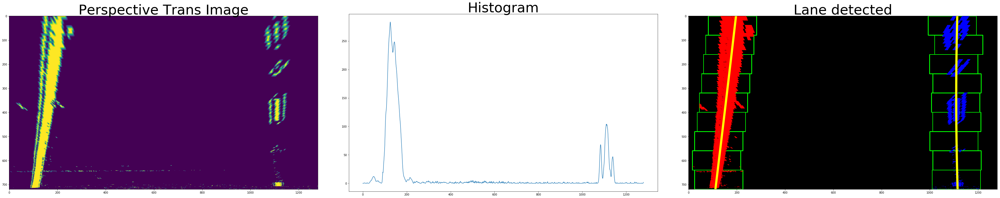

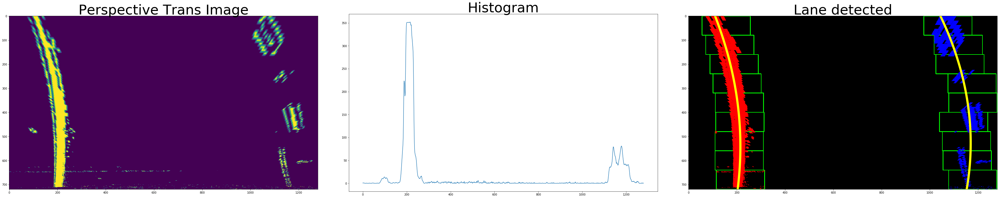

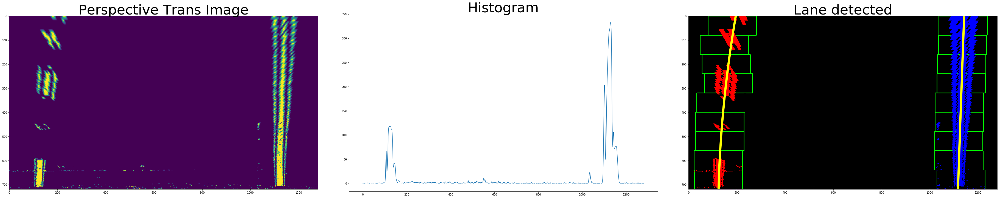

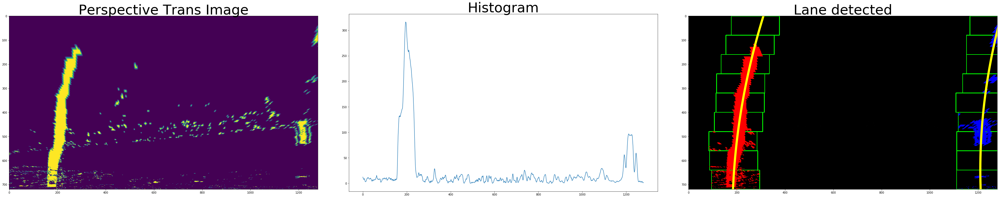

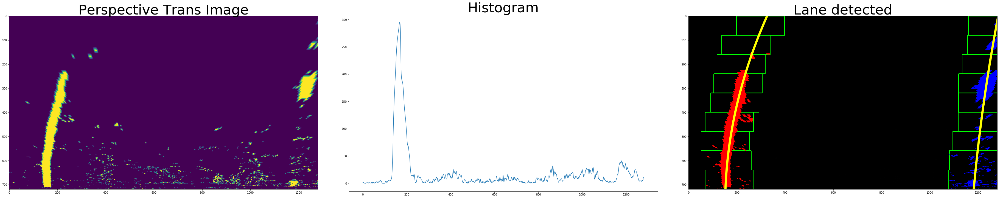

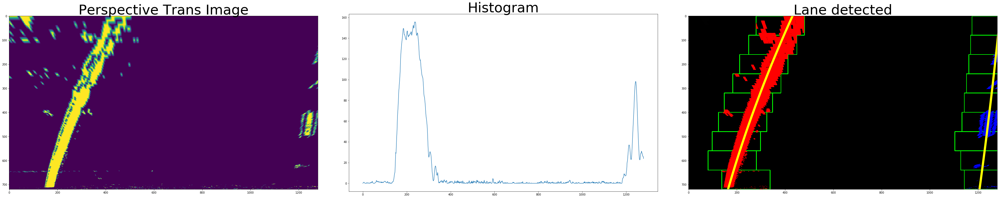

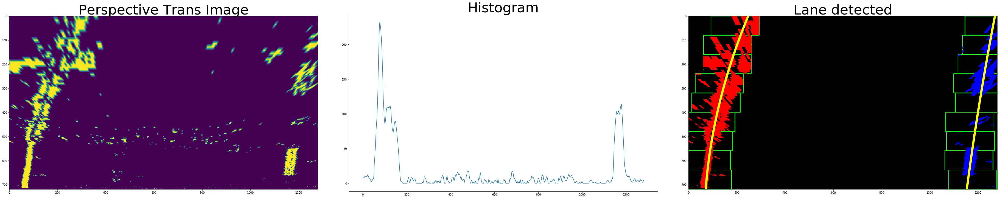

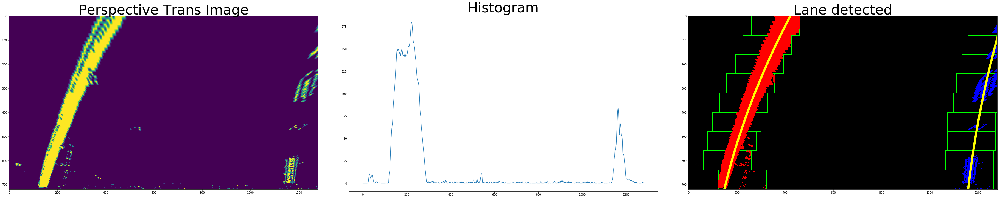

In [286]:
# Step 5 - Find lane lines
def advlf_step_find_lane_lines(test_images):
    
    left_lines_detected = list()
    right_lines_detected = list()
    
    for image in test_images:
        
        detected_left_line = Line()
        detected_right_line = Line()

        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(50, 10))
        
        histogram, out_img = advlf_lane_boundaries_fit_polynomial(image, detected_left_line, detected_right_line)
        
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title('Perspective Trans Image', fontsize=50)
        ax2.plot(histogram)
        ax2.set_title('Histogram', fontsize=50)
        ax3.imshow(out_img)
        ax3.set_title('Lane detected', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0., wspace=0.1)
        
        left_lines_detected.append(detected_left_line)
        right_lines_detected.append(detected_right_line)
        
    return left_lines_detected, right_lines_detected
        
left_lines_detected, right_lines_detected = advlf_step_find_lane_lines(perp_trans_images)

In [185]:
def advlf_step_read_images(test_folder='test_images'):
    # Step 0 - Read test images
    images = glob.glob(test_folder+'/*.jpg')      
    test_images = list()
    for fname in images:
        img = mpimg.imread(fname)
        test_images.append(img)
    
    return test_images
        
test_images = advlf_step_read_images(test_folder='test_images')
print('Success! Read ', len(test_images), ' images')

Success! Read  8  images


In [52]:
def advlf_step_calibrate_camera(calib_folder='camera_cal'):
    # Step 1 - Camera Calibration
    ret, mtx, dist, rvecs, tvecs = calibrate_camera(calib_folder, save_result=False)
    return ret, mtx, dist, rvecs, tvecs

ret, mtx, dist, rvecs, tvecs = advlf_step_calibrate_camera(calib_folder='camera_cal')
print('Calibration complete!')
print('Matrix : ', mtx)
print('Dist: ', dist)

Calibration complete!
Matrix :  [[  1.15777818e+03   0.00000000e+00   6.67113857e+02]
 [  0.00000000e+00   1.15282217e+03   3.86124583e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
Dist:  [[-0.24688507 -0.02373155 -0.00109831  0.00035107 -0.00259866]]


In [53]:
def advlf_step_undistort(test_images, mtx, dist):
    undistorted_images = list()
    # Step 2 - Distortion correction
    for ind, image in enumerate(test_images):
        undistorted_images.append(advlf_undistort(image, mtx, dist, save_result=False, image_name='image'+str(ind), 
                        destination_folder=os.path.join('output_images', 'undistort')))
        
    return undistorted_images

undistorted_images = advlf_step_undistort(test_images, mtx, dist)

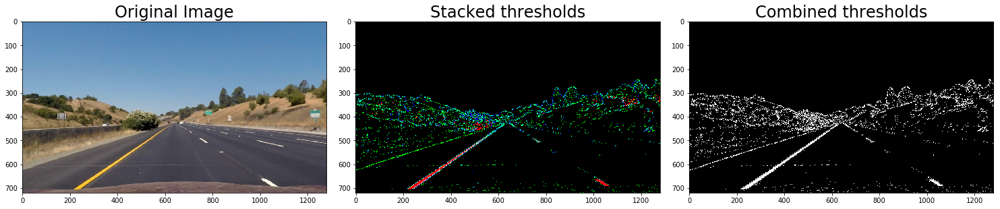

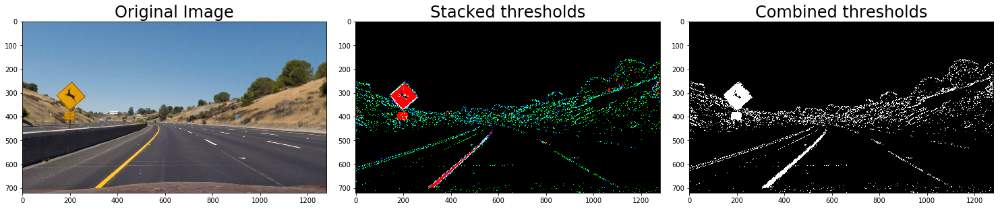

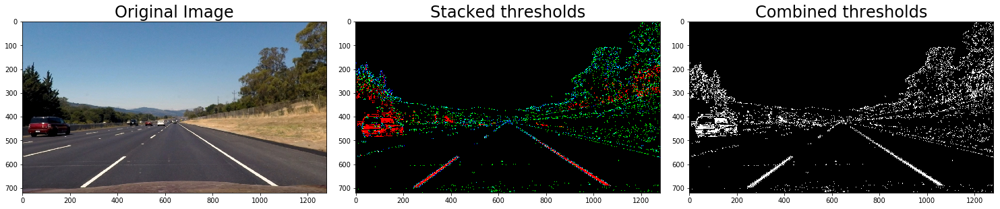

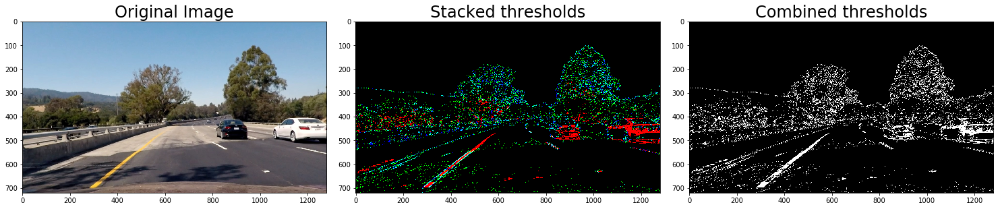

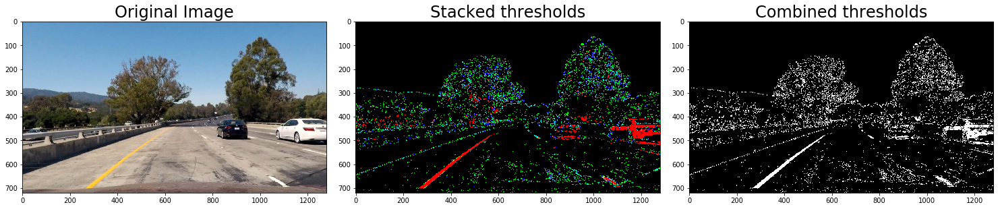

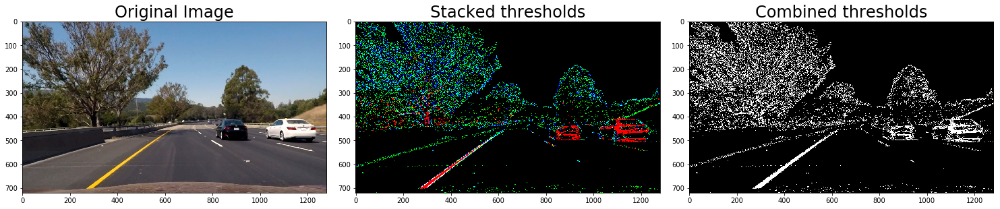

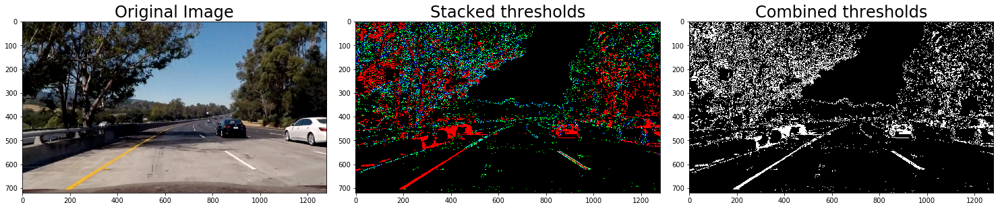

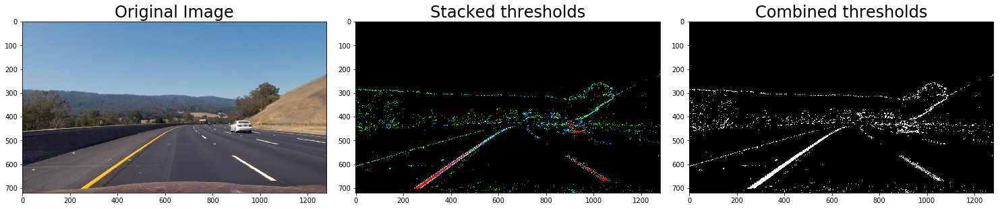

In [57]:
def advlf_step_gradient_threshold(test_images):
    grad_thresh_images = list()
    # Step 3 - Gradient Thresholding
    for image in test_images:
        grad_thresh_images.append(advlf_gradient_threshold(image))
    
    return grad_thresh_images

grad_thresh_images = advlf_step_gradient_threshold(undistorted_images)

[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)]
[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)]
[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)]
[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)]
[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)]
[(494.98387096774189, 490.08064516129025), (796.91935483870975, 490.08064516129025), (1080.7903225806451, 665.5645161290322), (205.95161290322579, 665.5645161290322)

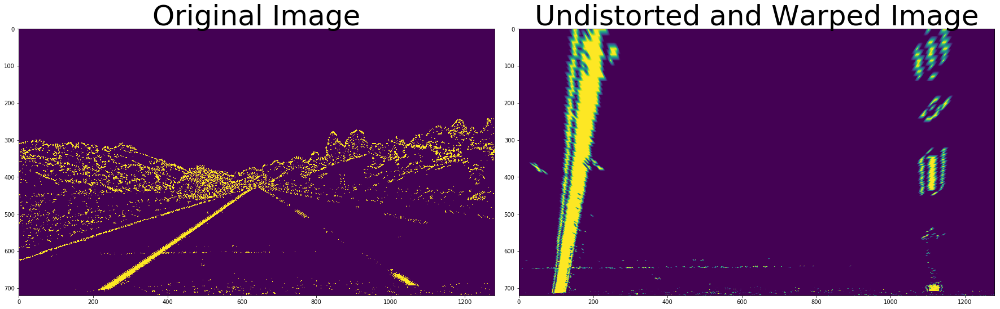

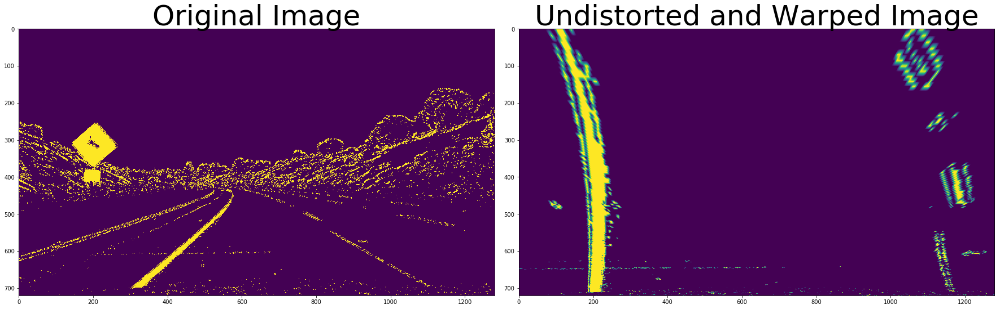

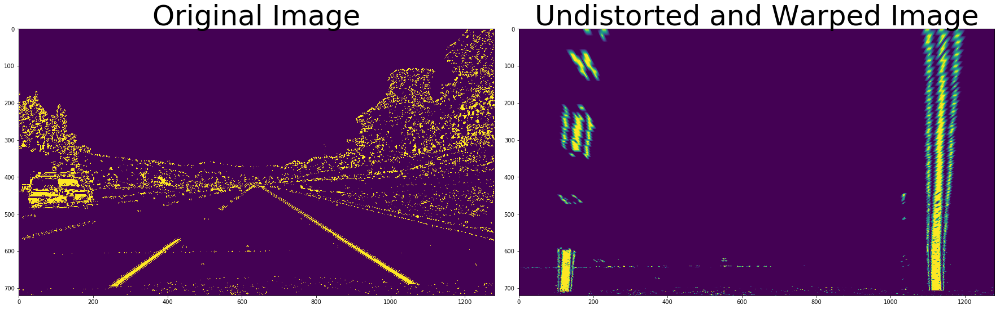

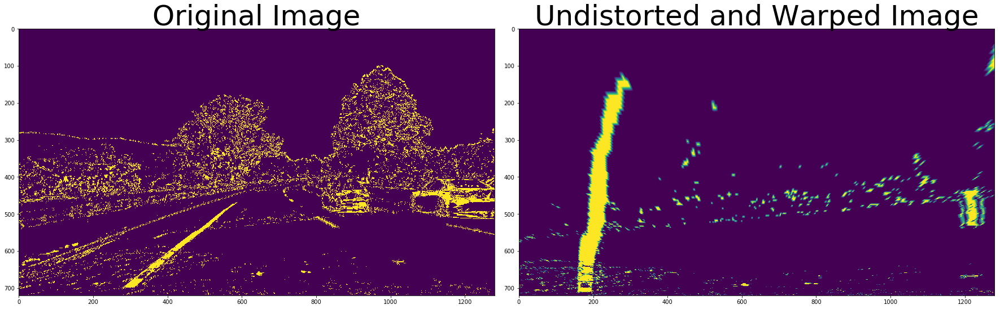

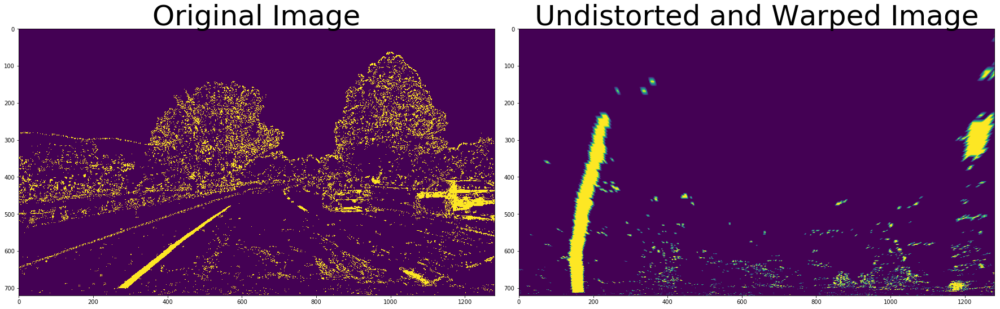

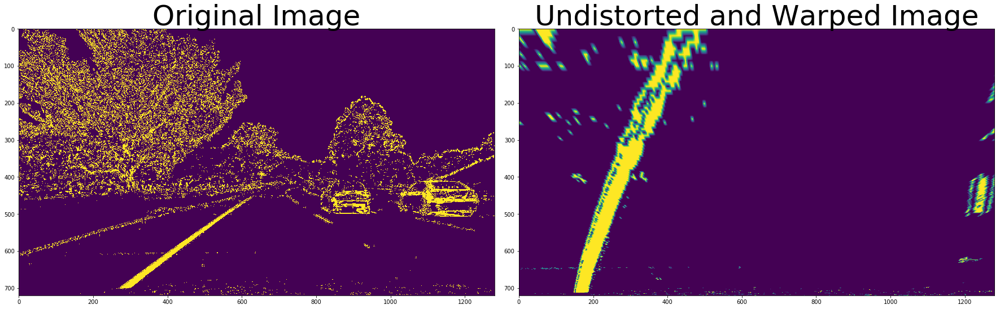

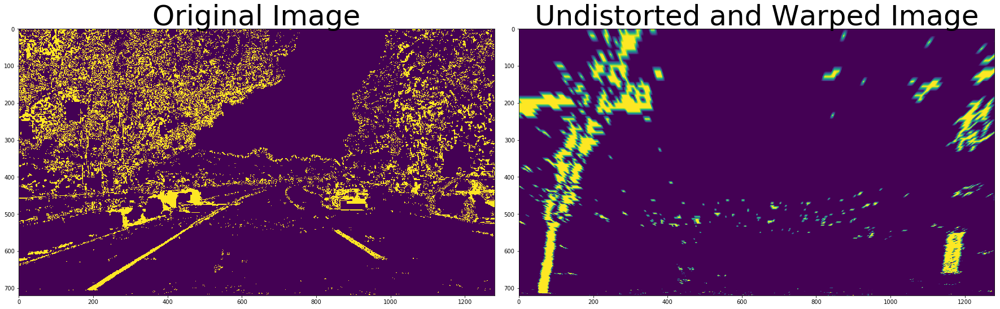

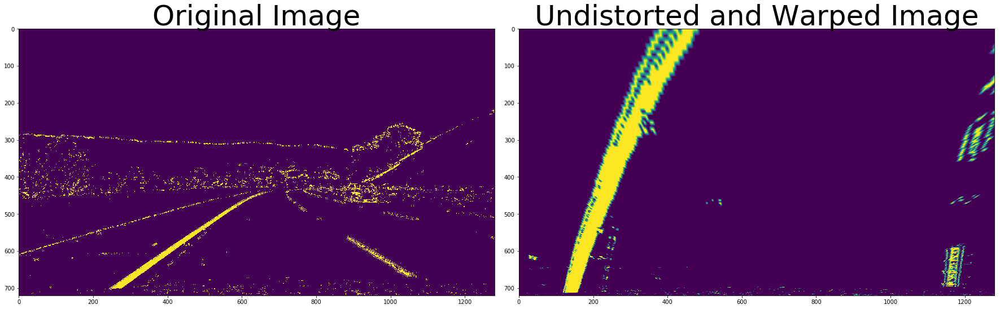

In [283]:
def advlf_step_perspective_transform(test_images):
    perp_trans_images = list()
    # Step 4 - Perspective Transform
    for image in test_images:
        perp_trans_images.append(advlf_perspective_transform(image))
    
    return perp_trans_images

perp_trans_images = advlf_step_perspective_transform(grad_thresh_images)

In [ ]:
#Step 6 Curvature computation

def measure_curvature(x_values, left_coeffs, right_coeffs):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(x_values)
    
    # Implement the calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad
    
    

In [65]:
def advanced_lane_finding_pipeline(calib_folder='camera_cal', test_folder='test_images'):
    
    # Step 0 - Read test images
    images = glob.glob(test_folder+'/*.jpg')      
    test_images = list()
    for fname in images:
        img = mpimg.imread(fname)
        test_images.append(img)
    
    
    # Step 1 - Camera Calibration
    ret, mtx, dist, rvecs, tvecs = calibrate_camera(calib_folder, save_result=False)
    
    # Step 2 - Distortion correction
    for ind, image in enumerate(test_images):
        advlf_undistort(image, mtx, dist, save_result=False, image_name='image'+str(ind), 
                        destination_folder=os.path.join('output_images', 'undistort'))
    
    # Step 3 - Gradient Thresholding
    for ind, image in enumerate(test_images):
        advlf_gradient_threshold(image)
            
    # Step 4 - Perspective Transform
    for ind, image in enumerate(test_images):
        advlf_perspective_transform(image)
    

[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.5322580645161)]
[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.5322580645161)]
[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.5322580645161)]
[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.5322580645161)]
[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.5322580645161)]
[(262.72580645161293, 681.04838709677415), (1036.9193548387095, 670.72580645161281), (685.95161290322585, 453.95161290322574), (585.30645161290317, 456.53225806

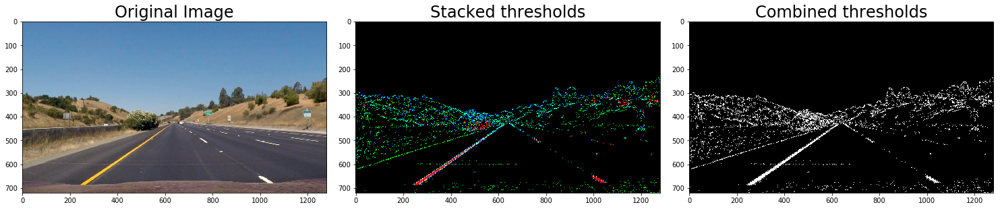

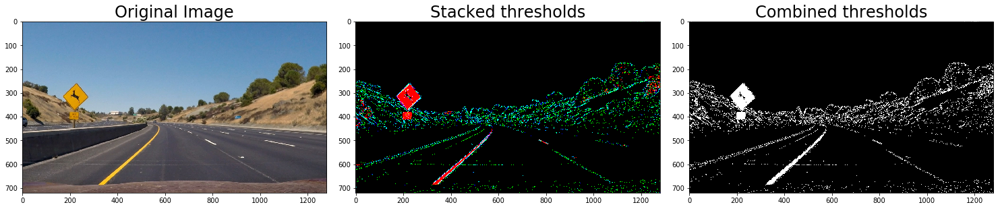

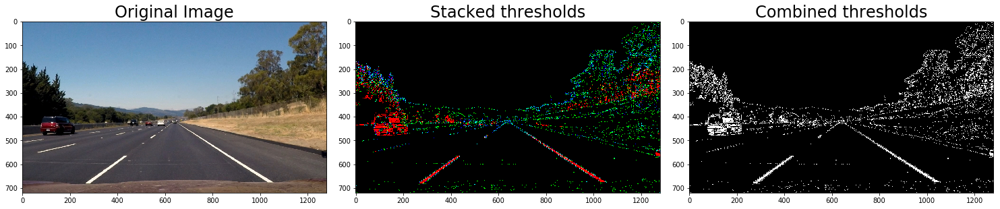

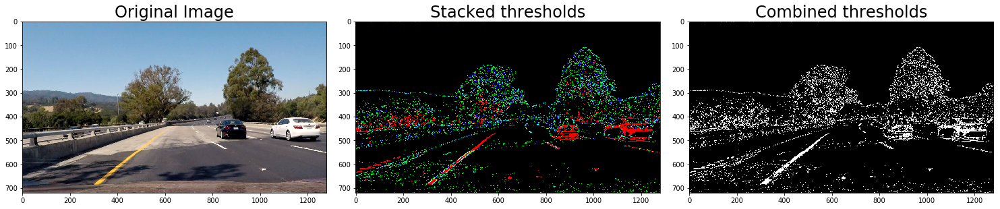

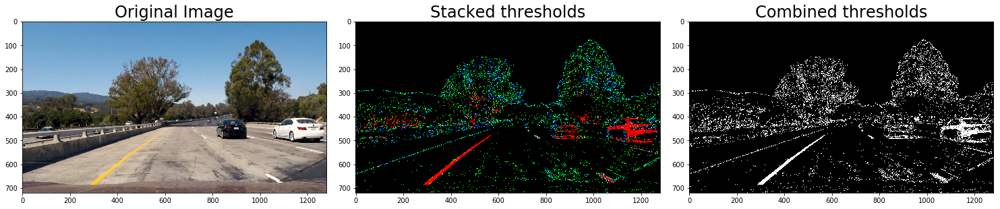

...

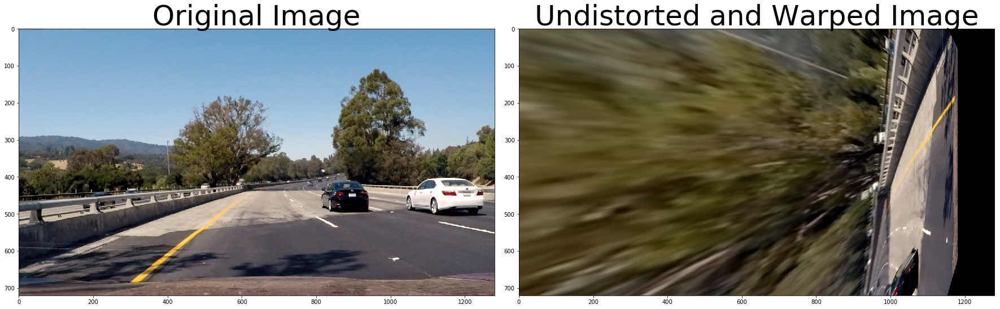

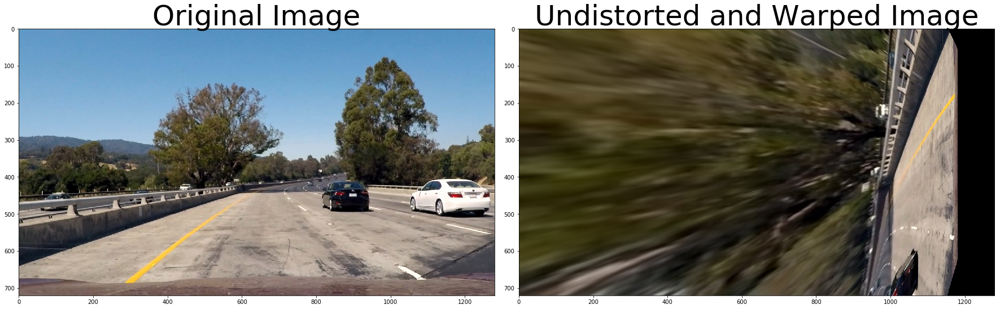

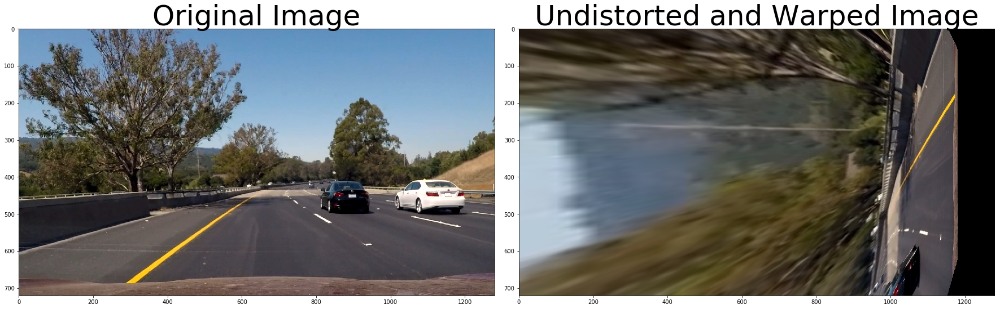

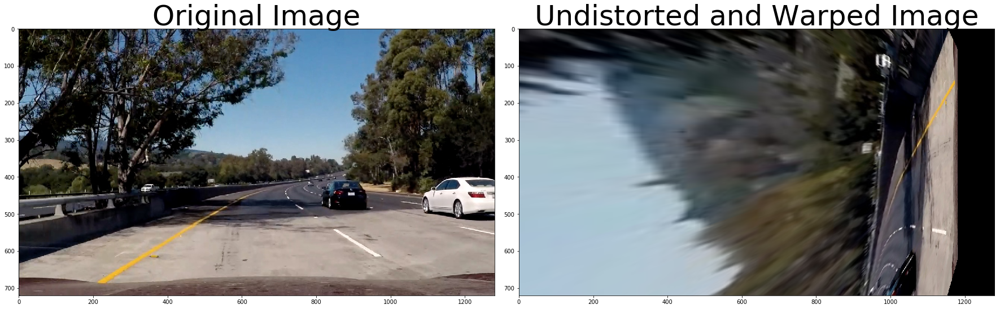

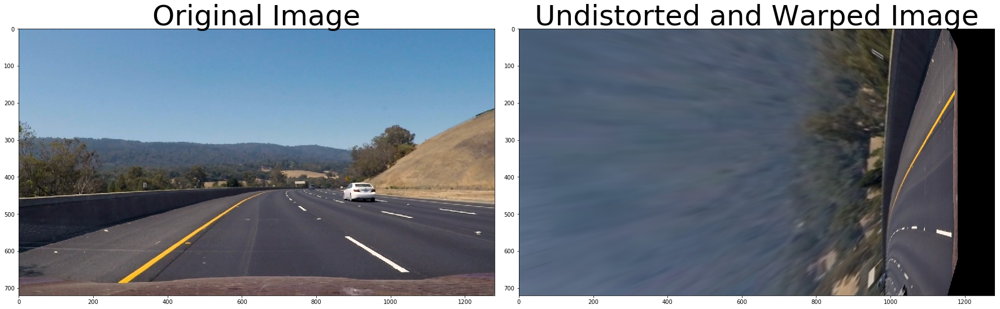

In [66]:
def main():
    
    advanced_lane_finding_pipeline()
    
main()